In [1]:
import cv2
import shutil
import os
import numpy as np
import matplotlib.pyplot as plt
from natsort import natsorted

In [2]:
def calculate_optical_flow(image_folder_A, image_folder_B, output_folder):
    # Get the list of images in each folder using natsorted
    images_A = natsorted(os.listdir(image_folder_A))
    images_B = natsorted(os.listdir(image_folder_B))

    for img_A, img_B in zip(images_A, images_B):
        # Read images
        path_A = os.path.join(image_folder_A, img_A)
        path_B = os.path.join(image_folder_B, img_B)
        frame1 = cv2.imread(path_A)
        frame2 = cv2.imread(path_B)

        # Convert images to grayscale
        gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        # Calculate dense optical flow
        flow = cv2.calcOpticalFlowFarneback(gray1, gray2, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # Save the optical flow as an image
        flow_image = flow_to_image(flow)
        output_path = os.path.join(output_folder, img_A)
        cv2.imwrite(output_path, flow_image)

        # Display images and flow
        plt.figure(figsize=(12, 4))

        plt.subplot(131)
        plt.imshow(cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB))
        plt.title('Image A')

        plt.subplot(132)
        plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
        plt.title('Image B')

        plt.subplot(133)
        plt.imshow(flow_image, cmap='gray')  # Use a grayscale colormap
        plt.title('Optical Flow')

        plt.show()

def flow_to_image(flow):
    # Convert flow to polar coordinates
    mag, _ = cv2.cartToPolar(flow[..., 0], flow[..., 1])

    # Normalize magnitude
    mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)

    # Convert to uint8
    flow_image = np.uint8(mag)

    return flow_image

In [3]:
# Example usage
image_folder_A = "C:/Users/jamay/OneDrive/Desktop/wildfire dataset/A"
image_folder_B = "C:/Users/jamay/OneDrive/Desktop/wildfire dataset/B"
output_folder = "C:/Users/jamay/OneDrive/Desktop/wildfire motion"

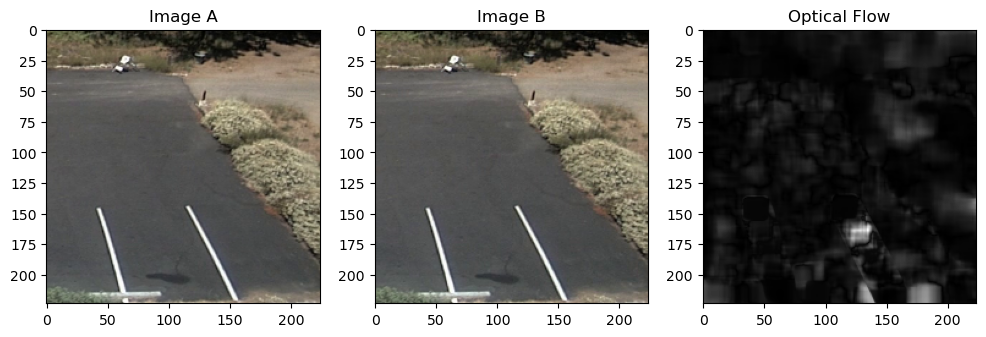

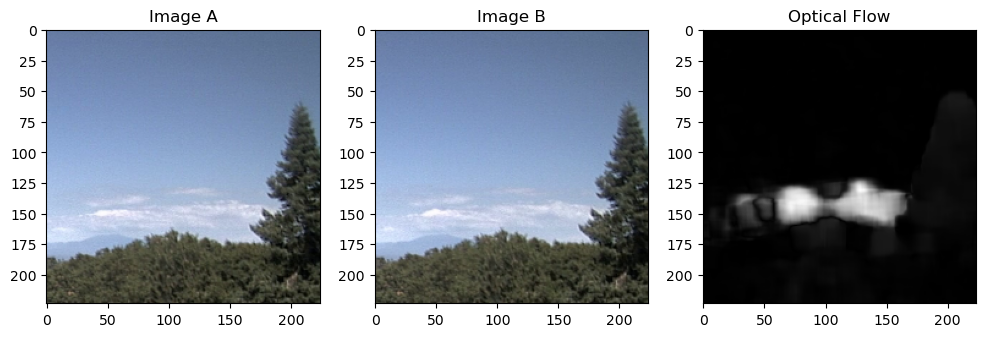

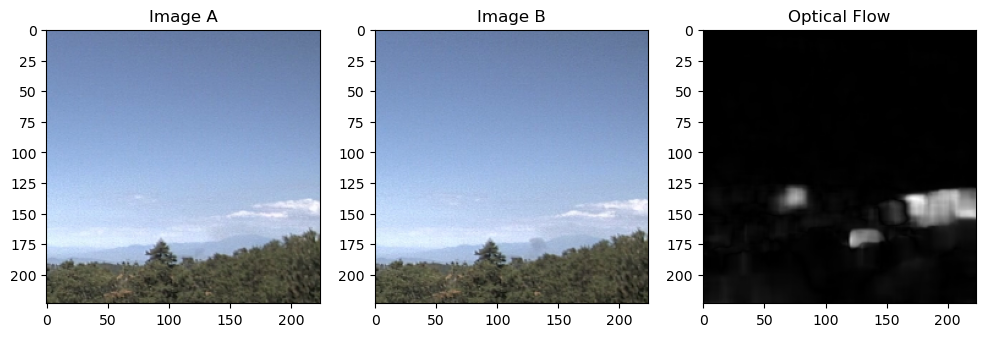

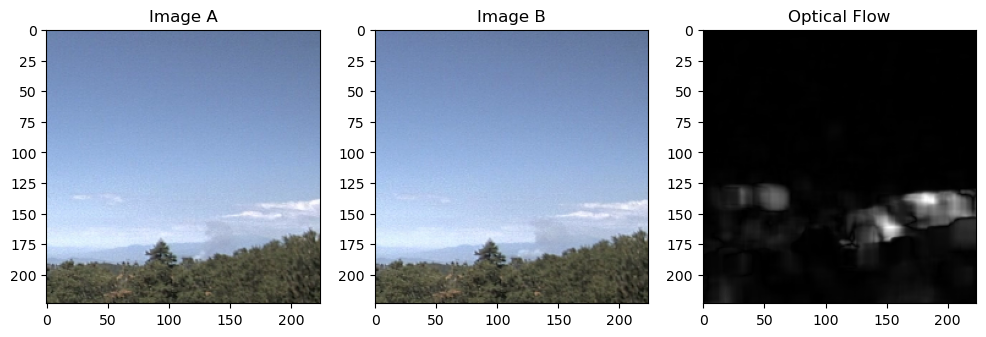

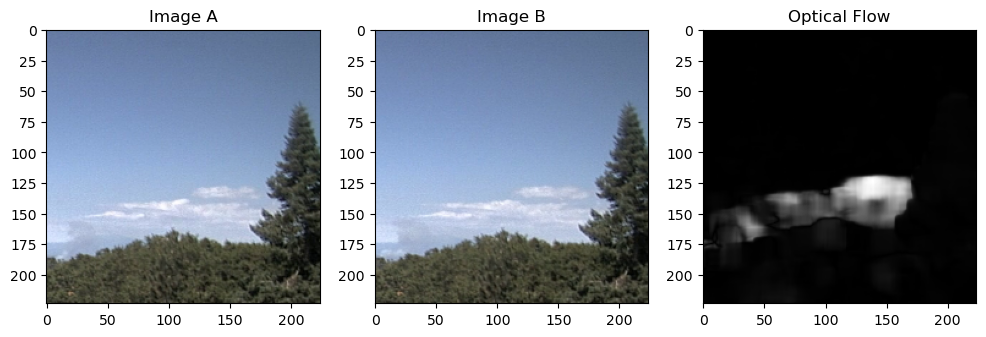

...

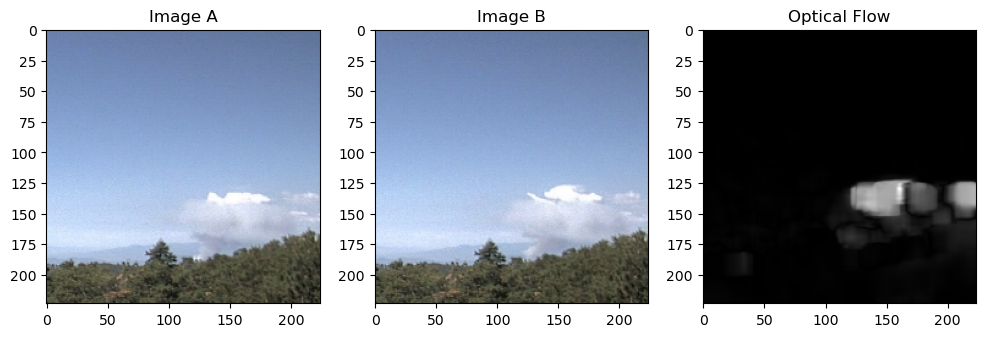

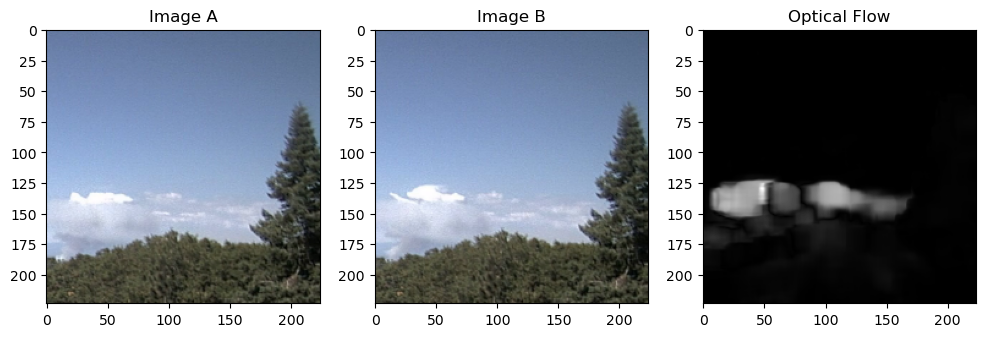

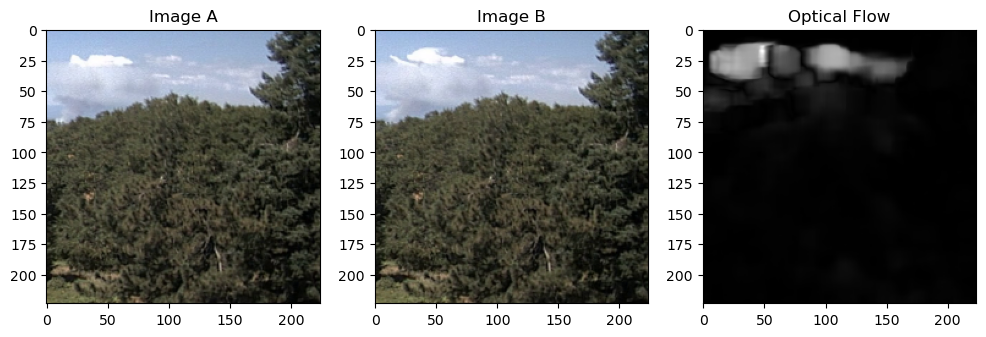

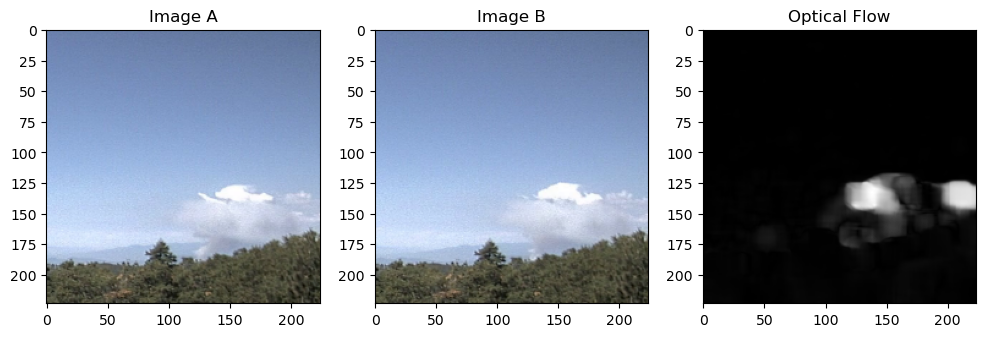

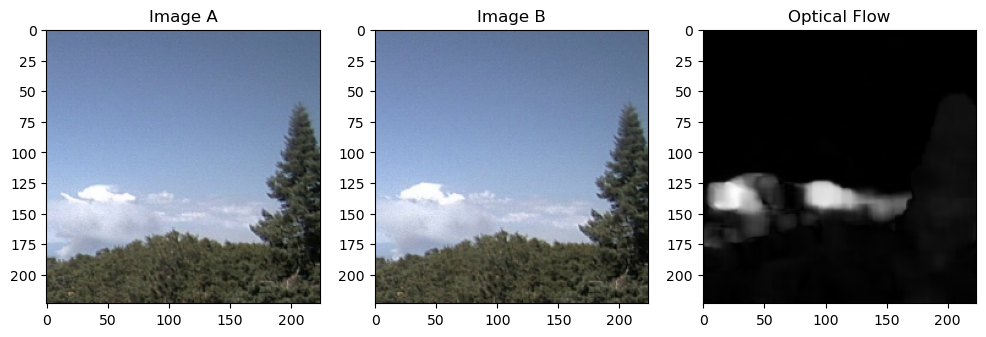

In [4]:
calculate_optical_flow(image_folder_A, image_folder_B, output_folder)